# general

ide dasar :
akan dilihat perbedaan distribusi dari model dengan data di luar data testing dan data "production", distribusi mencakup output model dan masing-masing variabel model. Akan ditinjau baik dari sisi distribusi umum maupun tingkat signifikansinya.    
    

In [1]:
import pandas as pd
import nannyml as nml
from IPython.display import display

In [5]:
# Load synthetic data
reference, analysis, analysis_target = nml.load_synthetic_binary_classification_dataset()
display(reference.head())
display(analysis.head())
display(analysis_target.head())

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1
3,2.530410,20K - 40K €,2.318722,7.944251,False,Tuesday,0.453649,3,1,2014-05-10 01:12:09,0.98,reference,1
4,2.253635,60K+ €,2.221265,8.884478,True,Thursday,5.695263,4,1,2014-05-10 02:21:34,0.99,reference,1


,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,timestamp,y_pred_proba,period,y_pred
0,0.527691,0 - 20K €,1.800003,8.960724,False,Tuesday,4.224628,50000,2017-08-31 04:20:00,0.99,analysis,1
1,8.485134,20K - 40K €,2.222074,8.768792,False,Friday,4.963103,50001,2017-08-31 05:16:16,0.98,analysis,1
2,2.073876,40K - 60K €,2.310077,8.649979,True,Friday,4.588951,50002,2017-08-31 05:56:44,0.98,analysis,1
3,0.118456,20K - 40K €,2.171441,8.855418,False,Tuesday,4.711015,50003,2017-08-31 06:10:17,0.97,analysis,1
4,4.786705,0 - 20K €,2.368541,8.394966,False,Monday,0.906738,50004,2017-08-31 06:29:38,0.92,analysis,1


,identifier,work_home_actual
0,50000,1
1,50001,1
2,50002,1
3,50003,1
4,50004,1


In [21]:
reference.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   distance_from_office        50000 non-null  float64
 1   salary_range                50000 non-null  object 
 2   gas_price_per_litre         50000 non-null  float64
 3   public_transportation_cost  50000 non-null  float64
 4   wfh_prev_workday            50000 non-null  bool   
 5   workday                     50000 non-null  object 
 6   tenure                      50000 non-null  float64
 7   identifier                  50000 non-null  int64  
 8   work_home_actual            50000 non-null  int64  
 9   timestamp                   50000 non-null  object 
 10  y_pred_proba                50000 non-null  float64
 11  period                      50000 non-null  object 
 12  y_pred                      50000 non-null  int64  
dtypes: bool(1), float64(5), int64(3

In [12]:
reference.identifier.nunique()

50000

In [10]:
analysis.shape

(50000, 12)

In [24]:
analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   distance_from_office        50000 non-null  float64
 1   salary_range                50000 non-null  object 
 2   gas_price_per_litre         50000 non-null  float64
 3   public_transportation_cost  50000 non-null  float64
 4   wfh_prev_workday            50000 non-null  bool   
 5   workday                     50000 non-null  object 
 6   tenure                      50000 non-null  float64
 7   identifier                  50000 non-null  int64  
 8   timestamp                   50000 non-null  object 
 9   y_pred_proba                50000 non-null  float64
 10  period                      50000 non-null  object 
 11  y_pred                      50000 non-null  int64  
dtypes: bool(1), float64(5), int64(2), object(4)
memory usage: 4.2+ MB


In [13]:
analysis.identifier.nunique()

50000

In [22]:
reference[reference['identifier'] == 50002]

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred


In [23]:
analysis[analysis['identifier'] == 0]

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,timestamp,y_pred_proba,period,y_pred


In [6]:
# Choose a chunker or set a chunk size
chunk_size = 5000

In [7]:
# Estimate model performance
# initialize, specify required data columns, fit estimator and estimate
estimator = nml.CBPE(
   y_pred_proba='y_pred_proba',
   y_pred='y_pred',
   y_true='work_home_actual',
   timestamp_column_name='timestamp',
   metrics=['roc_auc'],
   chunk_size=chunk_size,
)

In [8]:
estimator = estimator.fit(reference)
estimated_performance = estimator.estimate(analysis)

In [25]:
# Show results
figure = estimated_performance.plot(kind='performance', metric='roc_auc', plot_reference=True)
figure.show()

In [28]:
# Define feature columns
feature_column_names = [
    col for col in reference.columns if col not in [
        'timestamp', 'y_pred_proba', 'period', 'y_pred', 'work_home_actual', 'identifier'
    ]]

In [29]:
# Let's initialize the object that will perform the Univariate Drift calculations
univariate_calculator = nml.UnivariateStatisticalDriftCalculator(
    feature_column_names=feature_column_names,
    timestamp_column_name='timestamp',
    chunk_size=chunk_size
)
univariate_calculator = univariate_calculator.fit(reference)
univariate_results = univariate_calculator.calculate(analysis)
# Plot drift results for all model inputs
for feature in univariate_calculator.feature_column_names:
    figure = univariate_results.plot(
        kind='feature_drift',
        metric='statistic',
        feature_column_name=feature,
        plot_reference=True
    )
    figure.show()

In [30]:
# Rank features based on number of alerts
ranker = nml.Ranker.by('alert_count')
ranked_features = ranker.rank(univariate_results, only_drifting = False)
display(ranked_features)

calc = nml.StatisticalOutputDriftCalculator(
    y_pred='y_pred',
    y_pred_proba='y_pred_proba',
    timestamp_column_name='timestamp'
)
calc.fit(reference)
results = calc.calculate(analysis)

figure = results.plot(kind='prediction_drift', plot_reference=True)
figure.show()

,feature,number_of_alerts,rank
0,distance_from_office,5,1
1,salary_range,5,2
2,public_transportation_cost,5,3
3,wfh_prev_workday,5,4
4,tenure,2,5
5,gas_price_per_litre,0,6
6,workday,0,7


In [31]:
# Let's initialize the object that will detect Multivariate Drift
rcerror_calculator = nml.DataReconstructionDriftCalculator(feature_column_names=feature_column_names, timestamp_column_name='timestamp', chunk_size=chunk_size).fit(reference_data=reference)
# let's see Reconstruction error statistics for all available data
rcerror_results = rcerror_calculator.calculate(analysis)
figure = rcerror_results.plot(kind='drift', plot_reference=True)
figure.show()

# Estimating Performance for Binary Classification

In [32]:
import pandas as pd
import nannyml as nml
from IPython.display import display

In [33]:
reference_df = nml.load_synthetic_binary_classification_dataset()[0]
analysis_df = nml.load_synthetic_binary_classification_dataset()[1]

In [34]:
display(reference_df.head(3))

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1


In [35]:
display(analysis_df.head(3))

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,timestamp,y_pred_proba,period,y_pred
0,0.527691,0 - 20K €,1.800003,8.960724,False,Tuesday,4.224628,50000,2017-08-31 04:20:00,0.99,analysis,1
1,8.485134,20K - 40K €,2.222074,8.768792,False,Friday,4.963103,50001,2017-08-31 05:16:16,0.98,analysis,1
2,2.073876,40K - 60K €,2.310077,8.649979,True,Friday,4.588951,50002,2017-08-31 05:56:44,0.98,analysis,1


In [36]:
estimator = nml.CBPE(
    y_pred_proba='y_pred_proba',
    y_pred='y_pred',
    y_true='work_home_actual',
    timestamp_column_name='timestamp',
    metrics=['roc_auc', 'f1'],
    chunk_size=5000
)

In [37]:
estimator.fit(reference_df)

In [38]:
results = estimator.estimate(analysis_df)

In [39]:
display(results.data.head(3))

,key,start_index,end_index,start_date,end_date,realized_roc_auc,estimated_roc_auc,upper_confidence_roc_auc,lower_confidence_roc_auc,sampling_error_roc_auc,...,lower_threshold_roc_auc,alert_roc_auc,realized_f1,estimated_f1,upper_confidence_f1,lower_confidence_f1,sampling_error_f1,upper_threshold_f1,lower_threshold_f1,alert_f1
0,[0:4999],0,4999,2017-08-31 04:20:00,2018-01-02 00:45:44,NaN,0.968631,0.974063,0.963198,0.001811,...,0.963317,False,NaN,0.948555,0.966868,0.930242,0.006104,0.961094,0.935047,False
1,[5000:9999],5000,9999,2018-01-02 01:13:11,2018-05-01 13:10:10,NaN,0.969044,0.974476,0.963612,0.001811,...,0.963317,False,NaN,0.946578,0.964891,0.928265,0.006104,0.961094,0.935047,False
2,[10000:14999],10000,14999,2018-05-01 14:25:25,2018-09-01 15:40:40,NaN,0.969444,0.974876,0.964012,0.001811,...,0.963317,False,NaN,0.948807,0.967120,0.930494,0.006104,0.961094,0.935047,False


In [48]:
results.plot(kind='performance', metric='roc_auc',  plot_reference=True)

In [49]:
results.plot(kind='performance', metric='f1',  plot_reference=True)

# Comparing Estimated and Realized Performance

In [50]:
import nannyml as nml
reference, analysis, analysis_target = nml.load_synthetic_binary_classification_dataset()
analysis_target.head(3)

,identifier,work_home_actual
0,50000,1
1,50001,1
2,50002,1


In [51]:
import pandas as pd
import nannyml as nml
from IPython.display import display
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

In [52]:
reference, analysis, analysis_target = nml.load_synthetic_binary_classification_dataset()

estimator = nml.CBPE(
    y_pred_proba='y_pred_proba',
    y_pred='y_pred',
    y_true='work_home_actual',
    timestamp_column_name='timestamp',
    metrics=['roc_auc', 'f1'],
    chunk_size=5000
)

In [53]:
estimator.fit(reference)

In [54]:
results = estimator.estimate(pd.concat([reference, analysis], ignore_index=True))

In [55]:
analysis_full = pd.merge(analysis, analysis_target, on = 'identifier')
df_all = pd.concat([reference, analysis_full]).reset_index(drop=True)
target_col = 'work_home_actual'
pred_score_col = 'y_pred_proba'
actual_performance = []
for idx in results.data.index:
    start_index, end_index = results.data.loc[idx, 'start_index'], results.data.loc[idx, 'end_index']
    sub = df_all.loc[start_index:end_index]
    actual_perf = roc_auc_score(sub[target_col], sub[pred_score_col])
    results.data.loc[idx, 'actual_roc_auc'] = actual_perf

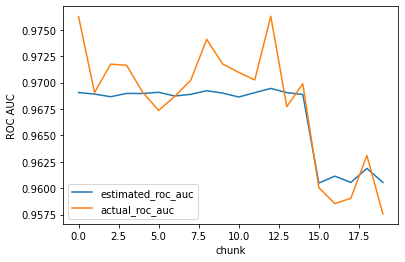

In [56]:
results.data[['estimated_roc_auc', 'actual_roc_auc']].plot()
plt.xlabel('chunk')
plt.ylabel('ROC AUC')
plt.show()

# Monitoring Realized Performance for Binary Classification

In [57]:
import pandas as pd
import nannyml as nml
from IPython.display import display

reference_df = nml.load_synthetic_binary_classification_dataset()[0]
analysis_df = nml.load_synthetic_binary_classification_dataset()[1]
analysis_target_df = nml.load_synthetic_binary_classification_dataset()[2]
analysis_df = analysis_df.merge(analysis_target_df, on='identifier')

display(reference_df.head(3))

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1


In [58]:
display(analysis_df)

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,timestamp,y_pred_proba,period,y_pred,work_home_actual
0,0.527691,0 - 20K €,1.800003,8.960724,False,Tuesday,4.224628,50000,2017-08-31 04:20:00,0.99,analysis,1,1
1,8.485134,20K - 40K €,2.222074,8.768792,False,Friday,4.963103,50001,2017-08-31 05:16:16,0.98,analysis,1,1
2,2.073876,40K - 60K €,2.310077,8.649979,True,Friday,4.588951,50002,2017-08-31 05:56:44,0.98,analysis,1,1
3,0.118456,20K - 40K €,2.171441,8.855418,False,Tuesday,4.711015,50003,2017-08-31 06:10:17,0.97,analysis,1,1
4,4.786705,0 - 20K €,2.368541,8.394966,False,Monday,0.906738,50004,2017-08-31 06:29:38,0.92,analysis,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,6.043911,0 - 20K €,1.983026,5.891216,True,Thursday,6.411578,99995,2021-01-01 02:42:38,0.17,analysis,0,0
49996,5.676665,20K - 40K €,2.048549,7.584098,True,Wednesday,3.863509,99996,2021-01-01 04:04:01,0.55,analysis,1,1
49997,3.143112,0 - 20K €,2.208197,6.574665,True,Tuesday,6.462975,99997,2021-01-01 04:12:57,0.22,analysis,0,1
49998,8.335141,40K - 60K €,2.394480,5.257455,True,Monday,6.407057,99998,2021-01-01 04:17:41,0.02,analysis,0,0


In [59]:
calc = nml.PerformanceCalculator(
    y_pred_proba='y_pred_proba',
    y_pred='y_pred',
    y_true='work_home_actual',
    timestamp_column_name='timestamp',
    metrics=nml.performance_estimation.confidence_based.results.SUPPORTED_METRIC_VALUES,
    chunk_size=5000)

calc.fit(reference_df)

In [60]:
results = calc.calculate(analysis_df)

In [61]:
display(results.data.head(3))

,key,start_index,end_index,start_date,end_date,period,targets_missing_rate,roc_auc,roc_auc_lower_threshold,roc_auc_upper_threshold,...,specificity,specificity_lower_threshold,specificity_upper_threshold,specificity_sampling_error,specificity_alert,accuracy,accuracy_lower_threshold,accuracy_upper_threshold,accuracy_sampling_error,accuracy_alert
0,[0:4999],0,4999,2017-08-31 04:20:00,2018-01-02 00:45:44,None,0.0,0.970962,0.963317,0.97866,...,0.937034,0.924741,0.960113,0.004657,False,0.9474,0.935079,0.960601,0.003144,False
1,[5000:9999],5000,9999,2018-01-02 01:13:11,2018-05-01 13:10:10,None,0.0,0.970248,0.963317,0.97866,...,0.944925,0.924741,0.960113,0.004657,False,0.9474,0.935079,0.960601,0.003144,False
2,[10000:14999],10000,14999,2018-05-01 14:25:25,2018-09-01 15:40:40,None,0.0,0.976282,0.963317,0.97866,...,0.943602,0.924741,0.960113,0.004657,False,0.9514,0.935079,0.960601,0.003144,False


In [62]:
for metric in calc.metrics:
    figure = results.plot(kind='performance', plot_reference=True, metric=metric)
    figure.show()

# Drift Detection for Binary Classification Model Outputs

In [63]:
import nannyml as nml
import pandas as pd
from IPython.display import display

In [64]:
reference_df = nml.load_synthetic_binary_classification_dataset()[0]
analysis_df = nml.load_synthetic_binary_classification_dataset()[1]

In [65]:
display(reference_df.head())

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1
3,2.530410,20K - 40K €,2.318722,7.944251,False,Tuesday,0.453649,3,1,2014-05-10 01:12:09,0.98,reference,1
4,2.253635,60K+ €,2.221265,8.884478,True,Thursday,5.695263,4,1,2014-05-10 02:21:34,0.99,reference,1


In [66]:
calc = nml.StatisticalOutputDriftCalculator(y_pred='y_pred', y_pred_proba='y_pred_proba', timestamp_column_name='timestamp')
calc.fit(reference_df)
results = calc.calculate(analysis_df)

In [67]:
display(results.data)

,key,start_index,end_index,start_date,end_date,y_pred_chi2,y_pred_p_value,y_pred_alert,y_pred_threshold,y_pred_proba_dstat,y_pred_proba_p_value,y_pred_proba_alert,y_pred_proba_threshold
0,[0:4999],0,4999,2017-08-31 04:20:00,2018-01-02 00:45:44,7.442383,0.006,True,0.05,0.02530,0.006,True,0.05
1,[5000:9999],5000,9999,2018-01-02 01:13:11,2018-05-01 13:10:10,1.800169,0.180,False,0.05,0.01230,0.494,False,0.05
2,[10000:14999],10000,14999,2018-05-01 14:25:25,2018-09-01 15:40:40,1.728529,0.189,False,0.05,0.01642,0.170,False,0.05
3,[15000:19999],15000,19999,2018-09-01 16:19:07,2018-12-31 10:11:21,1.589612,0.207,False,0.05,0.01058,0.685,False,0.05
4,[20000:24999],20000,24999,2018-12-31 10:38:45,2019-04-30 11:01:30,0.060896,0.805,False,0.05,0.01408,0.325,False,0.05
5,[25000:29999],25000,29999,2019-04-30 11:02:00,2019-09-01 00:24:27,12.512107,0.000,True,0.05,0.13070,0.000,True,0.05
6,[30000:34999],30000,34999,2019-09-01 00:28:54,2019-12-31 09:09:12,11.393384,0.001,True,0.05,0.12730,0.000,True,0.05
7,[35000:39999],35000,39999,2019-12-31 10:07:15,2020-04-30 11:46:53,9.813532,0.002,True,0.05,0.13110,0.000,True,0.05
8,[40000:44999],40000,44999,2020-04-30 12:04:32,2020-09-01 02:46:02,3.786524,0.052,False,0.05,0.11970,0.000,True,0.05
9,[45000:49999],45000,49999,2020-09-01 02:46:13,2021-01-01 04:29:32,27.990040,0.000,True,0.05,0.13752,0.000,True,0.05


In [68]:
predictions_drift_fig = results.plot(kind='prediction_drift', plot_reference=True)
predictions_drift_fig.show()

In [69]:
predictions_distribution_fig = results.plot(kind='prediction_distribution', plot_reference=True)
predictions_distribution_fig.show()

In [70]:
predicted_labels_drift_fig = results.plot(kind='predicted_labels_drift', plot_reference=True)
predicted_labels_drift_fig.show()

In [71]:
predicted_labels_distribution_fig = results.plot(kind='predicted_labels_distribution', plot_reference=True)
predicted_labels_distribution_fig.show()

# Univariate Drift Detection 

In [72]:
import nannyml as nml
import pandas as pd
from IPython.display import display

reference_df = nml.load_synthetic_binary_classification_dataset()[0]
analysis_df = nml.load_synthetic_binary_classification_dataset()[1]

display(reference_df.head())

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1
3,2.530410,20K - 40K €,2.318722,7.944251,False,Tuesday,0.453649,3,1,2014-05-10 01:12:09,0.98,reference,1
4,2.253635,60K+ €,2.221265,8.884478,True,Thursday,5.695263,4,1,2014-05-10 02:21:34,0.99,reference,1


In [73]:
feature_column_names = [
    col for col in reference_df.columns if col not in ['timestamp', 'y_pred_proba', 'period', 'y_pred', 'work_home_actual']]

calc = nml.UnivariateStatisticalDriftCalculator(feature_column_names=feature_column_names, timestamp_column_name='timestamp')

In [74]:
calc.fit(reference_df)

results = calc.calculate(analysis_df)

display(results.data.iloc[:5, :9])

,key,start_index,end_index,start_date,end_date,salary_range_chi2,salary_range_p_value,salary_range_alert,salary_range_threshold
0,[0:4999],0,4999,2017-08-31 04:20:00,2018-01-02 00:45:44,1.033683,0.793,False,0.05
1,[5000:9999],5000,9999,2018-01-02 01:13:11,2018-05-01 13:10:10,5.762412,0.124,False,0.05
2,[10000:14999],10000,14999,2018-05-01 14:25:25,2018-09-01 15:40:40,2.653961,0.448,False,0.05
3,[15000:19999],15000,19999,2018-09-01 16:19:07,2018-12-31 10:11:21,0.070843,0.995,False,0.05
4,[20000:24999],20000,24999,2018-12-31 10:38:45,2019-04-30 11:01:30,1.005422,0.800,False,0.05


In [75]:
display(univariate_results.data.iloc[-5:, :9])

,key,start_index,end_index,start_date,end_date,salary_range_chi2,salary_range_p_value,salary_range_alert,salary_range_threshold
5,[25000:29999],25000,29999,2019-04-30 11:02:00,2019-09-01 00:24:27,455.622094,0.0,True,0.05
6,[30000:34999],30000,34999,2019-09-01 00:28:54,2019-12-31 09:09:12,428.633384,0.0,True,0.05
7,[35000:39999],35000,39999,2019-12-31 10:07:15,2020-04-30 11:46:53,453.247444,0.0,True,0.05
8,[40000:44999],40000,44999,2020-04-30 12:04:32,2020-09-01 02:46:02,438.259970,0.0,True,0.05
9,[45000:49999],45000,49999,2020-09-01 02:46:13,2021-01-01 04:29:32,474.891775,0.0,True,0.05


In [76]:
for feature in calc.feature_column_names:
    drift_fig = results.plot(kind='feature_drift', feature_column_name=feature, plot_reference=True)
    drift_fig.show()

In [77]:
for cat_feat in calc.categorical_column_names:
    results.plot(kind='feature_distribution', feature_column_name=cat_feat, plot_reference=True).show()

In [78]:
ranker = nml.Ranker.by('alert_count')
ranked_features = ranker.rank(results, only_drifting = False)
display(ranked_features)

,feature,number_of_alerts,rank
0,identifier,10,1
1,distance_from_office,5,2
2,salary_range,5,3
3,public_transportation_cost,5,4
4,wfh_prev_workday,5,5
5,tenure,2,6
6,gas_price_per_litre,0,7
7,workday,0,8


# Multivariate Data Drift Detection

In [79]:
import nannyml as nml
import pandas as pd
from IPython.display import display

# Load synthetic data
reference, analysis, analysis_target = nml.load_synthetic_binary_classification_dataset()
display(reference.head())

,distance_from_office,salary_range,gas_price_per_litre,public_transportation_cost,wfh_prev_workday,workday,tenure,identifier,work_home_actual,timestamp,y_pred_proba,period,y_pred
0,5.962247,40K - 60K €,2.119485,8.568058,False,Friday,0.212653,0,1,2014-05-09 22:27:20,0.99,reference,1
1,0.535872,40K - 60K €,2.357199,5.425382,True,Tuesday,4.927549,1,0,2014-05-09 22:59:32,0.07,reference,0
2,1.969519,40K - 60K €,2.366849,8.247158,False,Monday,0.520817,2,1,2014-05-09 23:48:25,1.00,reference,1
3,2.530410,20K - 40K €,2.318722,7.944251,False,Tuesday,0.453649,3,1,2014-05-10 01:12:09,0.98,reference,1
4,2.253635,60K+ €,2.221265,8.884478,True,Thursday,5.695263,4,1,2014-05-10 02:21:34,0.99,reference,1


In [80]:
# Define feature columns
feature_column_names = [
    col for col in reference.columns if col not in [
        'timestamp', 'y_pred_proba', 'period', 'y_pred', 'work_home_actual', 'identifier'
    ]]

calc = nml.DataReconstructionDriftCalculator(
    feature_column_names=feature_column_names,
    timestamp_column_name='timestamp',
    chunk_size=5000
)
calc.fit(reference)
results = calc.calculate(analysis)

In [81]:
# Define feature columns
feature_column_names = [
    col for col in reference.columns if col not in [
        'timestamp', 'y_pred_proba', 'period', 'y_pred', 'work_home_actual', 'identifier'
    ]]

from sklearn.impute import SimpleImputer

calc = nml.DataReconstructionDriftCalculator(
    feature_column_names=feature_column_names,
    timestamp_column_name='timestamp',
    chunk_size=5000,
    imputer_categorical=SimpleImputer(strategy='constant', fill_value='missing'),
    imputer_continuous=SimpleImputer(strategy='median')
)
calc.fit(reference)
results = calc.calculate(analysis)

In [82]:
display(results.data)

,key,start_index,end_index,start_date,end_date,sampling_error,reconstruction_error,upper_confidence_bound,lower_confidence_bound,lower_threshold,upper_threshold,alert
0,[0:4999],0,4999,2017-08-31 04:20:00,2018-01-02 00:45:44,0.006962,1.118536,1.139423,1.097650,1.096577,1.138013,False
1,[5000:9999],5000,9999,2018-01-02 01:13:11,2018-05-01 13:10:10,0.006962,1.115044,1.135930,1.094157,1.096577,1.138013,False
2,[10000:14999],10000,14999,2018-05-01 14:25:25,2018-09-01 15:40:40,0.006962,1.125460,1.146346,1.104573,1.096577,1.138013,False
3,[15000:19999],15000,19999,2018-09-01 16:19:07,2018-12-31 10:11:21,0.006962,1.128453,1.149339,1.107567,1.096577,1.138013,False
4,[20000:24999],20000,24999,2018-12-31 10:38:45,2019-04-30 11:01:30,0.006962,1.122892,1.143779,1.102006,1.096577,1.138013,False
5,[25000:29999],25000,29999,2019-04-30 11:02:00,2019-09-01 00:24:27,0.006962,1.228393,1.249280,1.207507,1.096577,1.138013,True
6,[30000:34999],30000,34999,2019-09-01 00:28:54,2019-12-31 09:09:12,0.006962,1.220028,1.240914,1.199142,1.096577,1.138013,True
7,[35000:39999],35000,39999,2019-12-31 10:07:15,2020-04-30 11:46:53,0.006962,1.237394,1.258280,1.216508,1.096577,1.138013,True
8,[40000:44999],40000,44999,2020-04-30 12:04:32,2020-09-01 02:46:02,0.006962,1.206051,1.226938,1.185165,1.096577,1.138013,True
9,[45000:49999],45000,49999,2020-09-01 02:46:13,2021-01-01 04:29:32,0.006962,1.242579,1.263465,1.221693,1.096577,1.138013,True


In [83]:
figure = results.plot(plot_reference=True)
figure.show()